<a href="https://colab.research.google.com/github/sowmyakavali/ML-Practice/blob/main/Augmentation2.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#**Augmentation For Objectdetection**
    Here generating image for each augmentation method

#### **Install albumentation library**

In [1]:
!pip install -q -U albumentations
!echo "$(pip freeze | grep albumentations) is successfully installed"

albumentations==1.1.0 is successfully installed


#### **Import Libraries**

In [2]:
%matplotlib inline
import os
import cv2
import time
import random
import argparse
import numpy as np
import glob as glob
from tqdm import tqdm
import albumentations as A
from matplotlib import pyplot as plt

#### **Convert labels from yolo format to pascal voc format**

In [3]:
#convert from Yolo_mark to opencv format
def yoloFormattocv(x1, y1, x2, y2, H, W):
    bbox_width = x2 * W
    bbox_height = y2 * H
    center_x = x1 * W
    center_y = y1 * H
    voc = []
    voc.append(center_x - (bbox_width / 2))
    voc.append(center_y - (bbox_height / 2))
    voc.append(center_x + (bbox_width / 2))
    voc.append(center_y + (bbox_height / 2))
    return [int(v) for v in voc]

#### **Function to visualize the annotations**

In [4]:
BOX_COLOR = (255, 0, 0) # Red
TEXT_COLOR = (255, 255, 255) # White

def visualize_bbox(img, bbox, class_name, color=BOX_COLOR, thickness=3):
    """Visualizes a single bounding box on the image"""
    x_min, y_min, w, h = bbox[:4]
    x_min, x_max, y_min, y_max = int(x_min), int( w), int(y_min), int(h)
   
    cv2.rectangle(img, (x_min, y_min), (x_max, y_max), color=color, thickness=thickness)
    # class_name = category_id_to_name[bbox[-1]]
    
    ((text_width, text_height), _) = cv2.getTextSize(class_name, cv2.FONT_HERSHEY_SIMPLEX, 0.85, 5)    
    cv2.rectangle(img, (x_min, y_min - int(1.3 * text_height)), (x_min + text_width, y_min), BOX_COLOR, -1)
    cv2.putText(
                  img,
                  text=class_name,
                  org=(x_min, y_min - int(0.3 * text_height)),
                  fontFace=cv2.FONT_HERSHEY_SIMPLEX,
                  fontScale=0.85, 
                  color=TEXT_COLOR, 
                  lineType=cv2.LINE_AA,
                )
    return img

def visualize(image, bboxes, category_ids, category_id_to_name):
    img = image.copy()
    for bbox, category_id in zip(bboxes, category_ids):
        class_name = category_id_to_name[category_id]
        img = visualize_bbox(img, bbox, class_name)
    plt.figure(figsize=(12, 12))
    plt.axis('off')
    plt.imshow(img)

#### **Display function**

In [5]:
def display(images_path, labels_path, category_id_to_name ):
  for img in tqdm(glob.glob(images_path+"/*.jpg")[:10]):
    image = cv2.imread(img)
    H,W = image.shape[:2]
    image = cv2.cvtColor(image, cv2.COLOR_RGB2BGR)
    label_file = img.split("/")[-1].split(".")[0]+".txt"
    bboxes = []
    category_ids = []
    if os.path.isfile(os.path.join(labels_path, label_file)):
       with open(os.path.join(labels_path, label_file), 'r') as f:
            for line in f:
              bbox = line.strip('\n').split(' ')
              box = yoloFormattocv(float(bbox[1]), float(bbox[2]), float(bbox[3]), float(bbox[4]), H, W)
              bboxes.append(box)
              category_ids.append(int(bbox[0]))                 
    visualize(image, bboxes, category_ids, category_id_to_name)  

#### **Paths**

In [6]:
images_path = "/content/ODS/images"
labels_path = "/content/ODS/labels"

#### **Display**

 60%|██████    | 3/5 [00:00<00:00, 23.14it/s]

/content/ODS/images/00d6242640a1dddd.jpg
/content/ODS/images/00d0ae2a372fe5e1.jpg
/content/ODS/images/00d6cb1aaff62b31.jpg
/content/ODS/images/00ca2058dc008ade.jpg
/content/ODS/images/00d5d782664b9752.jpg


100%|██████████| 5/5 [00:00<00:00, 21.60it/s]


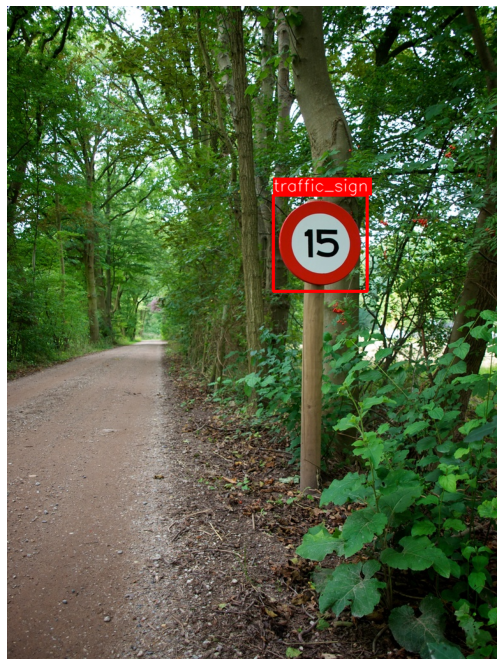

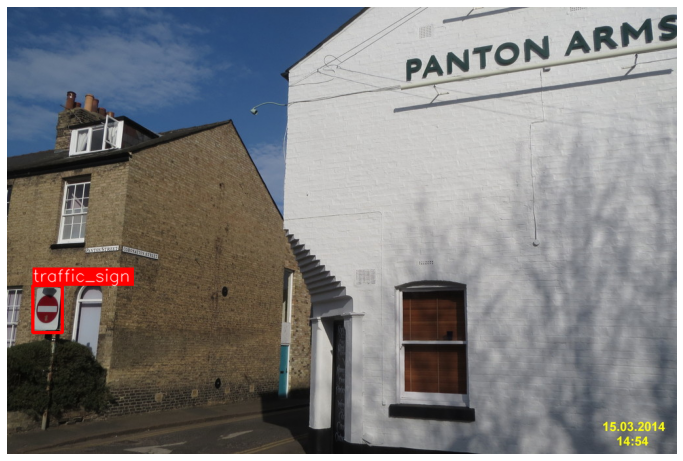

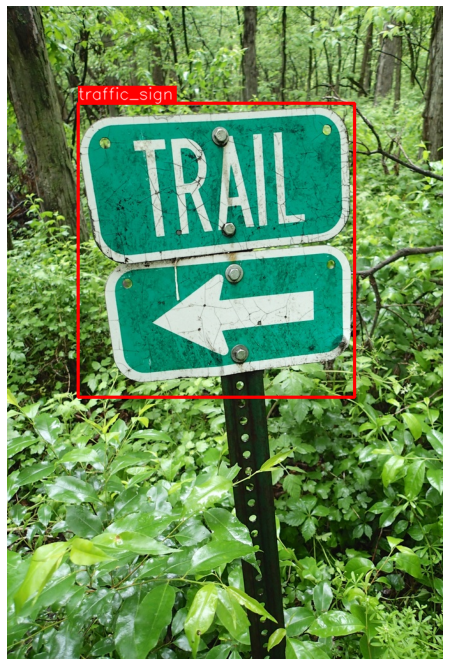

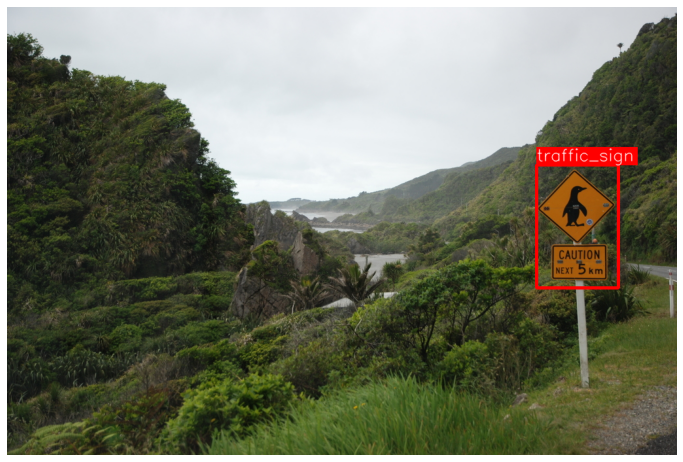

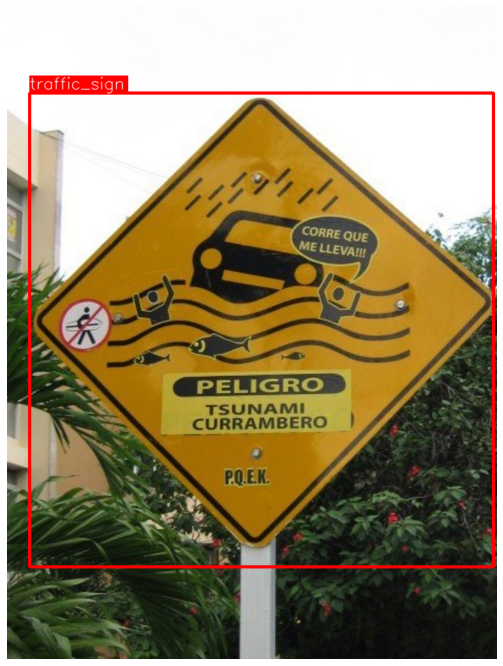

In [7]:
# We will use the mapping from category_id to the class name
# to visualize the class label for the bounding box on the image
category_id_to_name = { 0: 'traffic_sign'}
display(images_path, labels_path, category_id_to_name )         

#### **Apply augmentation methods**

In [8]:
def write_images_and_labels(image, 
                            boxes, 
                            labelss, 
                            aug_type, 
                            image_name, 
                            augment_images_path, 
                            augment_labels_path):

    image_write_path = os.path.join(augment_images_path, image_name +'_' + aug_type + '.jpg' )
    label_write_path = os.path.join(augment_labels_path, image_name +'_' + aug_type + '.txt' )

    if os.path.exists(image_write_path):
        os.remove(image_write_path)  
    if os.path.exists(label_write_path):
        os.remove(label_write_path)     

    cv2.imwrite(image_write_path, image)
        
    mode = 'a' if os.path.exists(label_write_path) else 'w'

    for i,j in zip(boxes,labelss):
        line = [j]
        line.extend(i)
        with open(label_write_path, mode) as fout:   
            new_line =' '.join(map(str, line))                
            fout.write(new_line+'\n') 

In [14]:
for img in tqdm(glob.glob(images_path+"/*.jpg")):

    image = cv2.imread(img)
    H,W = image.shape[:2]
    # image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
        
    image_name = img.split("/")[-1].split(".")[0]
    label_file = image_name + ".txt"

    bboxes = []
    category_ids = []

    if os.path.isfile(os.path.join(labels_path, label_file)):
      with open(os.path.join(labels_path, label_file), 'r') as f:
          for line in f:
            bbox = line.strip('\n').split(' ')
            box= list(map(float, bbox[1:]))
            bboxes.append(box)
            category_ids.append(int(bbox[0]))

    augment_images_path = os.path.join("augmented_data", "images")
    augment_labels_path = os.path.join("augmented_data", "labels")

    if not os.path.isdir(augment_images_path):
      os.makedirs(augment_images_path) 
      print("done", augment_images_path) 
    if not os.path.isdir(augment_labels_path):
      os.makedirs(augment_labels_path) 
      print("done", augment_labels_path)

    # Method 1
    aug_type = "gray"
    transform1 = A.Compose([A.ToGray(p=0.9)],
                           bbox_params=A.BboxParams(format="yolo", 
                                                    label_fields=['class_labels']),)
    transformed1 = transform1(image=image, 
                              bboxes=bboxes, 
                              class_labels=category_ids)  
    img, boxes1, labels1 = transformed1['image'], transformed1['bboxes'], transformed1['class_labels']   
    write_images_and_labels(img, boxes1, 
                            labels1, aug_type, 
                            image_name, augment_images_path, augment_labels_path) 

    # Method 2
    aug_type = "blur"
    transform2 = A.Compose([A.MedianBlur(p=0.8)],                         
                            bbox_params=A.BboxParams(format="yolo", 
                                                 label_fields=['class_labels']), )
    transformed2 = transform2(image=image, 
                              bboxes=bboxes, 
                              class_labels=category_ids)  
    img, boxes2, labels2 = transformed2['image'], transformed2['bboxes'], transformed2['class_labels'] 
    write_images_and_labels(img, boxes2, 
                            labels2, aug_type, 
                            image_name, augment_images_path, augment_labels_path)

    # Method 3
    aug_type = "shiftscale"
    transform3 = A.Compose([A.ShiftScaleRotate(p=0.5),],
                            bbox_params=A.BboxParams(format="yolo", 
                                                     min_area=4500, 
                                                     min_visibility=0.3, 
                                                     label_fields=['class_labels']),)
    transformed3 = transform3(image=image, 
                              bboxes=bboxes, 
                              class_labels=category_ids)  
    img, boxes3, labels3 = transformed3['image'], transformed3['bboxes'], transformed3['class_labels'] 
    write_images_and_labels(img, boxes3, 
                            labels3, aug_type, 
                            image_name, augment_images_path, augment_labels_path)  

    # Method 4
    aug_type = "contrast"
    transform4 = A.Compose([A.RandomBrightnessContrast(p=0.8)],
                            bbox_params=A.BboxParams(format="yolo", 
                                                     label_fields=['class_labels']),)
    transformed4 = transform4(image=image, 
                              bboxes=bboxes, 
                              class_labels=category_ids)  
    img, boxes4, labels4 = transformed4['image'], transformed4['bboxes'], transformed4['class_labels'] 
    write_images_and_labels(img, boxes4, 
                            labels4, aug_type, 
                            image_name, augment_images_path, augment_labels_path) 

    # Method 5
    aug_type = "crop"
    transform5 = A.Compose([A.RandomSizedBBoxSafeCrop(width=512, 
                                                      height=512, 
                                                      erosion_rate=0.2)],
                           bbox_params=A.BboxParams(format="yolo", 
                                                    min_area=4500, 
                                                    min_visibility=0.3, 
                                                    label_fields=['class_labels']),)
    transformed5 = transform5(image=image, 
                              bboxes=bboxes, 
                              class_labels=category_ids)  
    img, boxes5, labels5 = transformed5['image'], transformed5['bboxes'], transformed5['class_labels'] 
    write_images_and_labels(img, boxes5, 
                            labels5, aug_type, 
                            image_name, augment_images_path, augment_labels_path) 

    # Method 6
    aug_type = "colorshift"
    transform6 = A.Compose([A.RGBShift(r_shift_limit=30, 
                                       g_shift_limit=30, 
                                       b_shift_limit=30, 
                                       p=0.5)],
                        bbox_params=A.BboxParams(format="yolo", 
                                                 min_area=4500, 
                                                 min_visibility=0.3, 
                                                 label_fields=['class_labels']),)
    transformed6 = transform6(image=image, 
                              bboxes=bboxes, 
                              class_labels=category_ids)  
    img, boxes6, labels6 = transformed6['image'], transformed6['bboxes'], transformed6['class_labels'] 
    write_images_and_labels(img, boxes6, 
                            labels6, aug_type, 
                            image_name, augment_images_path, augment_labels_path) 

  0%|          | 0/5 [00:00<?, ?it/s]

done augmented_data/images
done augmented_data/labels


100%|██████████| 5/5 [00:00<00:00,  5.41it/s]


#### **Check the results**

 30%|███       | 3/10 [00:00<00:00, 23.07it/s]

augmented_data/images/00d0ae2a372fe5e1_blur.jpg
augmented_data/images/00d6cb1aaff62b31_colorshift.jpg
augmented_data/images/00d6242640a1dddd_colorshift.jpg
augmented_data/images/00ca2058dc008ade_shiftscale.jpg
augmented_data/images/00ca2058dc008ade_blur.jpg


100%|██████████| 10/10 [00:00<00:00, 24.70it/s]

augmented_data/images/00d5d782664b9752_crop.jpg
augmented_data/images/00d6242640a1dddd_gray.jpg
augmented_data/images/00d0ae2a372fe5e1_contrast.jpg
augmented_data/images/00d6cb1aaff62b31_gray.jpg
augmented_data/images/00d5d782664b9752_shiftscale.jpg


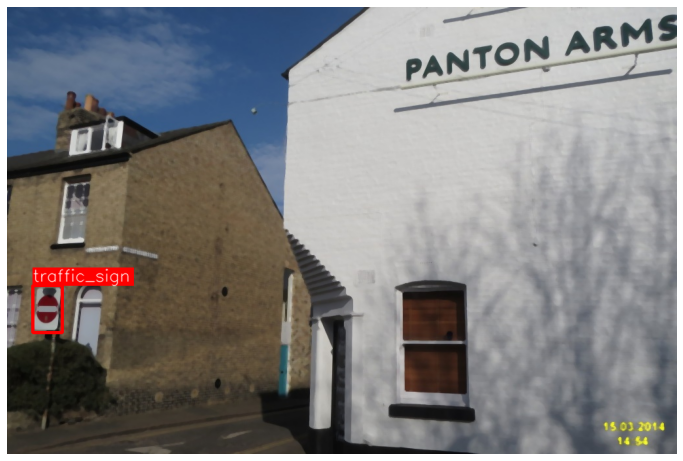

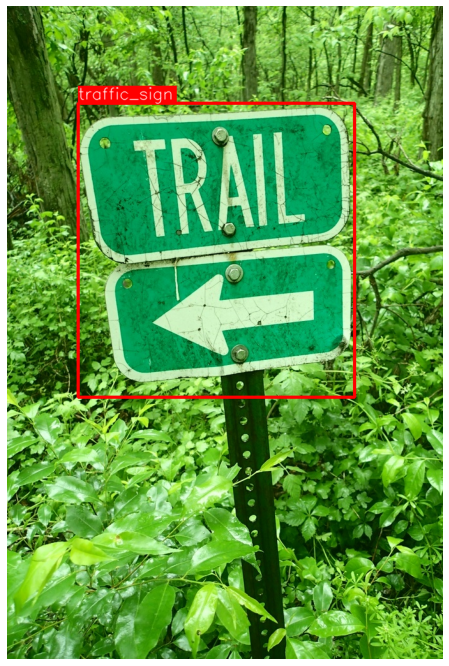

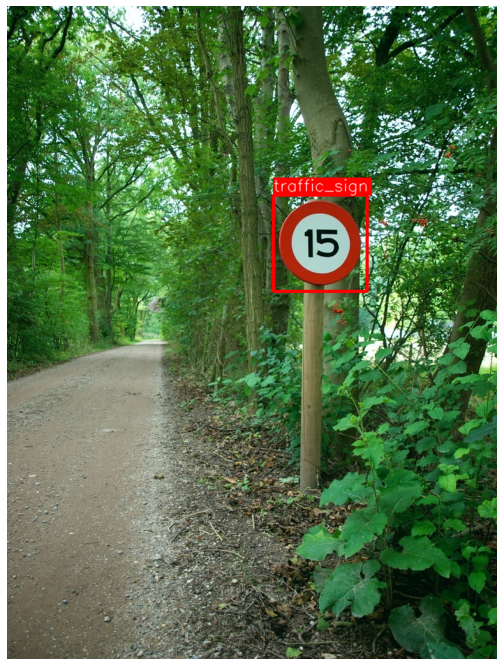

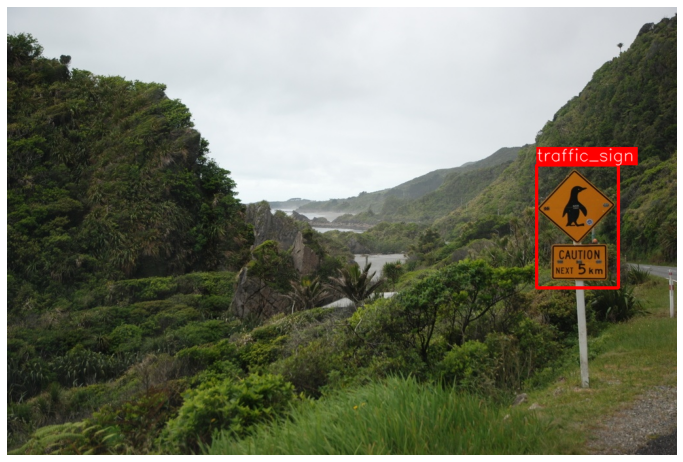

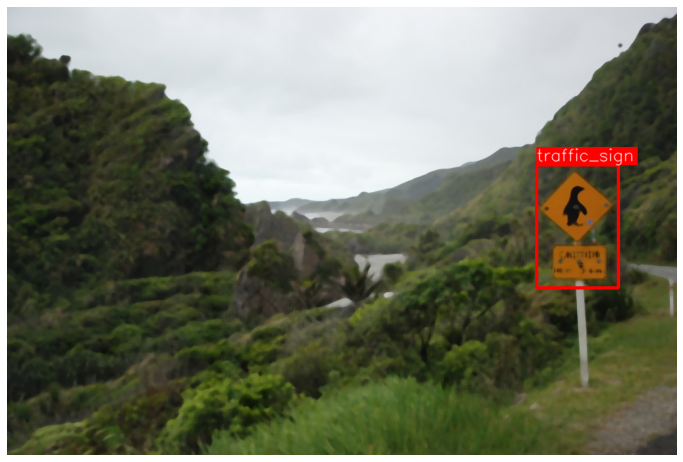

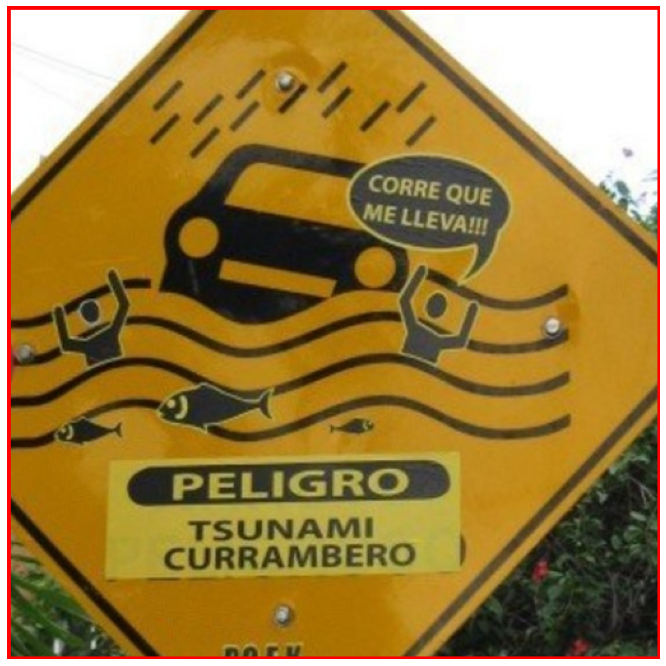

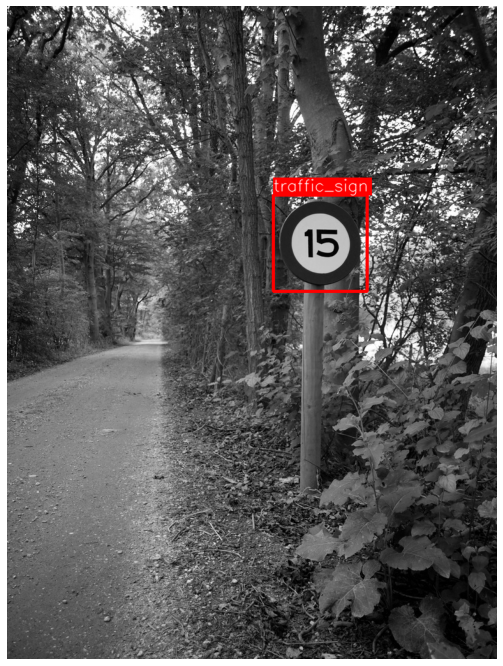

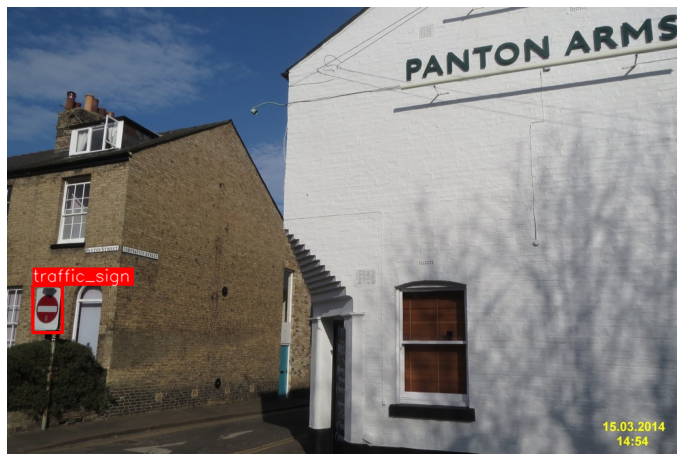

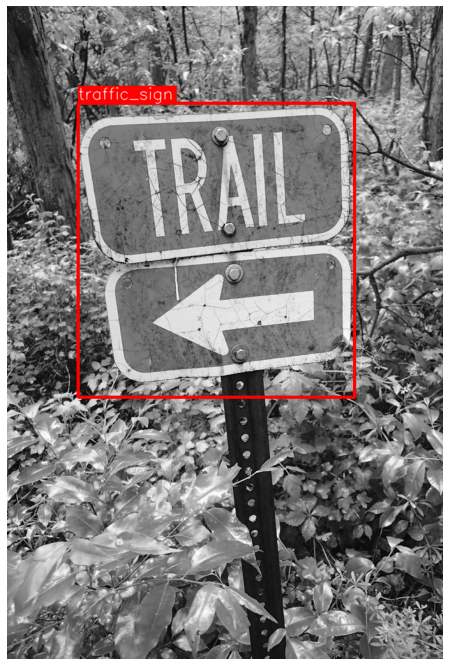

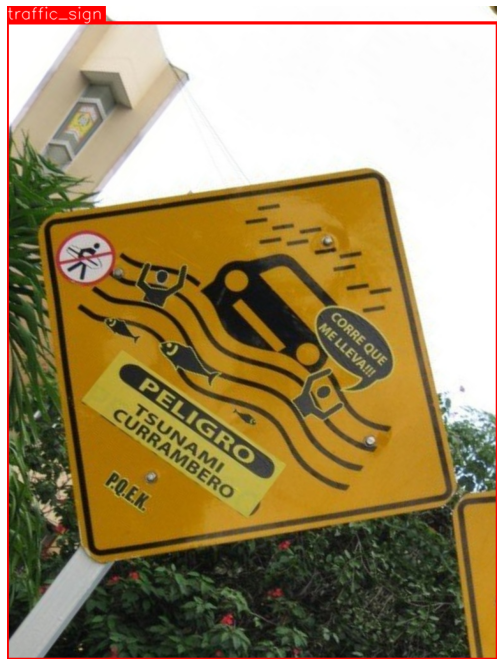

In [15]:
category_id_to_name = { 0: 'traffic_sign'}
display(augment_images_path, augment_labels_path, category_id_to_name )  

In [16]:
print(len(os.listdir("/content/augmented_data/images")),
      len(os.listdir("/content/augmented_data/labels")))

30 28
